<h1><center>COVID-19 Dynamic Charts - World</center></h1>

## Table of Contents<a name='0'></a>
1. [Import Modules in Python](#1)
2. [Load Data to Python](#2)
3. [Data Processing](#3)
4. [Create COVID-19 Dynamic Charts](#4)
5. [Flatten the Curve](#5)

### 1. Import Modules in Python<a name='1'></a>
[Return to content](#0)

In [1]:
import pandas as pd
print('Current pandas version: %s'%(pd.__version__) )

import pyecharts
print('Current pyecharts version: %s'%(pyecharts.__version__) )

import numpy as np

# 更新之后控制台会出现 PendingDeprecationWarning 的提示。
# 如需关闭，请在核心代码前加入如下代码：
try:
    from pyecharts.globals import WarningType
    WarningType.ShowWarning = False
except:
    pass

from pyecharts import options as opts
from pyecharts.charts import Map, Timeline

import seaborn as sns
print('Current seaborn version: %s'%(sns.__version__) )
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

Current pandas version: 1.1.1
Current pyecharts version: 1.8.1
Current seaborn version: 0.10.1


In [2]:
pd.set_option('display.max_rows', 20)
pd.set_option('display.max_columns', 15)
pd.set_option('display.max_colwidth', 1000)

### 2. Load Data to Python<a name='2'></a>
[Return to content](#0)

In [3]:
# Read csv file
df = pd.read_csv('./data/time_series_covid19_confirmed_global.csv')

### 3. Data Processing<a name='3'></a>
[Return to content](#0)

In [4]:
# Check number of rows/columns
df.shape

(271, 332)

In [5]:
# Get top 5 rows
df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,...,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,...,47716,47851,48053,48116,48229,48527,48718
1,NaN,Albania,41.15330,20.168300,0,0,0,...,44436,45188,46061,46863,47742,48530,49191
2,NaN,Algeria,28.03390,1.659600,0,0,0,...,89416,90014,90579,91121,91638,92102,92597
3,NaN,Andorra,42.50630,1.521800,0,0,0,...,7127,7162,7190,7236,7288,7338,7382
4,NaN,Angola,-11.20270,17.873900,0,0,0,...,15729,15804,15925,16061,16161,16188,16277


In [6]:
# Check column type
df.dtypes

Province/State     object
Country/Region     object
Lat               float64
Long              float64
1/22/20             int64
                   ...   
12/10/20            int64
12/11/20            int64
12/12/20            int64
12/13/20            int64
12/14/20            int64
Length: 332, dtype: object

In [7]:
# Check missing
mc = df.isna().sum()
mc[mc>0]

Province/State    188
Lat                 1
Long                1
dtype: int64

In [8]:
for var in df.dtypes[df.dtypes=='object'].index.tolist():
    print(var, df[df[var]==''].shape[0])

Province/State 0
Country/Region 0


In [9]:
# Get Canada's data
df[df['Country/Region']=='Canada']

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,...,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20
39,Alberta,Canada,53.9333,-116.5765,0,0,0,...,72028,73488,75054,76792,78382,80099,81986
40,British Columbia,Canada,53.7267,-127.6476,0,0,0,...,38718,39337,40060,40797,40797,40797,42943
41,Diamond Princess,Canada,0.0000,0.0000,0,0,0,...,0,0,0,0,0,0,0
42,Grand Princess,Canada,0.0000,0.0000,0,0,0,...,13,13,13,13,13,13,13
43,Manitoba,Canada,53.7609,-98.8139,0,0,0,...,19376,19655,19947,20392,20750,21023,21264
44,New Brunswick,Canada,46.5653,-66.4619,0,0,0,...,541,542,546,554,555,557,558
45,Newfoundland and Labrador,Canada,53.1355,-57.6604,0,0,0,...,352,353,354,355,358,358,358
46,Northwest Territories,Canada,64.8255,-124.8457,0,0,0,...,15,15,15,20,20,20,21
47,Nova Scotia,Canada,44.6820,-63.7443,0,0,0,...,1383,1389,1393,1402,1409,1415,1420
48,Nunavut,Canada,70.2998,-83.1076,0,0,0,...,220,229,229,245,247,247,256


In [10]:
# Get China's data
df[df['Country/Region']=='China']

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,...,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20
58,Anhui,China,31.8257,117.2264,1,9,15,...,992,992,992,992,992,992,992
59,Beijing,China,40.1824,116.4142,14,22,36,...,952,952,952,952,954,955,956
60,Chongqing,China,30.0572,107.8740,6,9,27,...,590,590,590,590,590,590,590
61,Fujian,China,26.0789,117.9874,1,5,10,...,500,501,501,502,502,502,502
62,Gansu,China,35.7518,104.2861,0,2,2,...,182,182,182,182,182,182,182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,Tianjin,China,39.3054,117.3230,4,4,8,...,301,301,301,302,302,302,302
87,Tibet,China,31.6927,88.0924,0,0,0,...,1,1,1,1,1,1,1
88,Xinjiang,China,41.1129,85.2401,0,2,2,...,980,980,980,980,980,980,980
89,Yunnan,China,24.9740,101.4870,1,2,5,...,221,221,222,223,224,224,224


In [11]:
# Drop 'Province/State','Lat','Long'
dfc = df.drop(['Province/State','Lat','Long'], axis=1)
dfc.head(1)

,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20
0,Afghanistan,0,0,0,0,0,0,...,47716,47851,48053,48116,48229,48527,48718


In [12]:
# Aggregate data to Country level
dfc = dfc.pivot_table(index=['Country/Region'], aggfunc=np.sum)
dfc.shape

(191, 328)

In [13]:
# Get top 5 rows
dfc.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,9/30/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20
Country/Region,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,...,39268,38304,38324,38398,38494,38520,38544
Albania,0,0,0,0,0,0,0,...,13649,9967,10102,10255,10406,10553,10704
Algeria,0,0,0,0,0,0,0,...,51530,45773,46071,46364,46653,46938,47216
Andorra,0,0,0,0,0,0,0,...,2050,1215,1215,1215,1261,1261,1301
Angola,0,0,0,0,0,0,0,...,4972,2876,2935,2965,2981,3033,3092


In [14]:
# Get Canada's data
dfc.loc[['Canada']]

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,9/30/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20
Country/Region,,,,,,,,,,,,,,,
Canada,0,0,0,0,1,1,2,...,161107,133141,133511,133890,134295,135757,136135


In [15]:
# Get China's data
dfc.loc[['China']]

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,9/30/20,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20
Country/Region,,,,,,,,,,,,,,,
China,548,643,920,1406,2075,2877,5509,...,90545,90008,90025,90058,90078,90087,90100


In [16]:
# Change data structure : put date as one column
dfc = dfc.stack().reset_index()
dfc.head()

,Country/Region,level_1,0
0,Afghanistan,1/22/20,0
1,Afghanistan,1/23/20,0
2,Afghanistan,1/24/20,0
3,Afghanistan,1/25/20,0
4,Afghanistan,1/26/20,0


In [17]:
# Change column name
dfc.columns = ['Country','Date','ConfirmedCount']
dfc.head()

,Country,Date,ConfirmedCount
0,Afghanistan,1/22/20,0
1,Afghanistan,1/23/20,0
2,Afghanistan,1/24/20,0
3,Afghanistan,1/25/20,0
4,Afghanistan,1/26/20,0


In [18]:
# Get Canada's data
dfc[dfc.Country=='Canada']

,Country,Date,ConfirmedCount
10496,Canada,1/22/20,0
10497,Canada,1/23/20,0
10498,Canada,1/24/20,0
10499,Canada,1/25/20,0
10500,Canada,1/26/20,1
...,...,...,...
10819,Canada,9/5/20,133511
10820,Canada,9/6/20,133890
10821,Canada,9/7/20,134295
10822,Canada,9/8/20,135757


In [19]:
# Get China's data
dfc[dfc.Country=='China']

,Country,Date,ConfirmedCount
11808,China,1/22/20,548
11809,China,1/23/20,643
11810,China,1/24/20,920
11811,China,1/25/20,1406
11812,China,1/26/20,2075
...,...,...,...
12131,China,9/5/20,90025
12132,China,9/6/20,90058
12133,China,9/7/20,90078
12134,China,9/8/20,90087


In [20]:
# Check column types
dfc.dtypes

Country           object
Date              object
ConfirmedCount     int64
dtype: object

In [21]:
dfc[dfc.Country==''].shape

(0, 3)

In [22]:
dfc[dfc.Date==''].shape

(0, 3)

In [23]:
dfc.isna().sum()

Country           0
Date              0
ConfirmedCount    0
dtype: int64

In [24]:
# Convert string date to real date format
dfc['Date'] = pd.to_datetime(dfc.Date)

In [25]:
# Check column types again
dfc.dtypes

Country                   object
Date              datetime64[ns]
ConfirmedCount             int64
dtype: object

In [26]:
# Sort data by Date and Country
dfc = dfc.sort_values(by=['Date','Country']) \
         .reset_index(drop=True)

In [27]:
dfc.head()

,Country,Date,ConfirmedCount
0,Afghanistan,2020-01-22,0
1,Albania,2020-01-22,0
2,Algeria,2020-01-22,0
3,Andorra,2020-01-22,0
4,Angola,2020-01-22,0


In [28]:
# Get Canada's data
dfc[dfc.Country=='Canada']

,Country,Date,ConfirmedCount
32,Canada,2020-01-22,0
223,Canada,2020-01-23,0
414,Canada,2020-01-24,0
605,Canada,2020-01-25,0
796,Canada,2020-01-26,1
...,...,...,...
61725,Canada,2020-12-10,445828
61916,Canada,2020-12-11,452543
62107,Canada,2020-12-12,458527
62298,Canada,2020-12-13,464443


In [29]:
# Get China's data
dfc[dfc.Country=='China']

,Country,Date,ConfirmedCount
36,China,2020-01-22,548
227,China,2020-01-23,643
418,China,2020-01-24,920
609,China,2020-01-25,1406
800,China,2020-01-26,2075
...,...,...,...
61729,China,2020-12-10,94025
61920,China,2020-12-11,94124
62111,China,2020-12-12,94217
62302,China,2020-12-13,94328


#### Confirmed Case ranking

In [30]:
# dfc[dfc.Date=='2020-12-14'].sort_values(by='ConfirmedCount', ascending=False).head(100)
dfc[dfc.Date=='2020-12-14'].nlargest(n=20, columns='ConfirmedCount')

,Country,Date,ConfirmedCount
62634,US,2020-12-14,16518487
62536,India,2020-12-14,9906165
62480,Brazil,2020-12-14,6927145
62598,Russia,2020-12-14,2656601
62519,France,2020-12-14,2433859
62638,United Kingdom,2020-12-14,1874867
62633,Turkey,2020-12-14,1866345
62542,Italy,2020-12-14,1855737
62618,Spain,2020-12-14,1751884
62463,Argentina,2020-12-14,1503222


In [31]:
# Total confirmed case as of December 14, 2020
dfc[dfc.Date=='2020-12-14'].ConfirmedCount.sum()

72848675

### 4. Create COVID-19 Dynamic Charts<a name='4'></a>
[Return to content](#0)

In [32]:
# Get date list
date_ls = dfc.Date.drop_duplicates().sort_values().dt.strftime('%Y-%m-%d').tolist()
print(date_ls[-5:])

['2020-12-10', '2020-12-11', '2020-12-12', '2020-12-13', '2020-12-14']


In [33]:
# Change some country names so that it can show up in the map properly
dfc.loc[dfc.Country=='US','Country'] = 'United States'
dfc.loc[dfc.Country=='Korea, South','Country'] = 'Korea'
dfc.loc[dfc.Country=='Czechia','Country'] = 'Czech Rep'
dfc.loc[dfc.Country.isin(['Congo (Brazzaville)','Congo (Kinshasa)']),'Country'] = 'Dem. Rep. Congo'
dfc.loc[dfc.Country.isin(['South Sudan']),'Country'] = 'S. Sudan'

In [34]:
dfc[dfc.Date=='2020-12-14'].describe()

,ConfirmedCount
count,1.910000e+02
mean,3.814067e+05
std,1.514656e+06
min,1.000000e+00
25%,4.412500e+03
50%,3.347800e+04
75%,1.781720e+05
max,1.651849e+07


In [35]:
pieces = [
              {"max": 10000},                
              {"min": 10000,   "max": 99999},
              {"min": 100000,  "max": 499999},
              {"min": 500000,  "max": 999999},
              {"min": 1000000, "max": 4999999},
              {"min": 5000000, "max": 9999999},
              {"min": 10000000},
]

In [36]:
tl = Timeline()
for i in date_ls:
    map0 = (
        Map()
        .add("累计确诊人数", [list(z) for z in zip(dfc.loc[dfc.Date==i,'Country'], dfc.loc[dfc.Date==i,'ConfirmedCount'])], "world")
        .set_series_opts(label_opts=opts.LabelOpts(is_show=False))
        .set_global_opts(
            title_opts=opts.TitleOpts(title="截止：{}，COVID-19累计确诊人数（世界版）".format(i)),
            legend_opts=opts.LegendOpts(is_show=False),
            visualmap_opts=opts.VisualMapOpts(is_piecewise=True, pieces=pieces
            )))
    tl.add(map0, "{}".format(i))
tl.render_notebook()

### 5. Flatten the Curve<a name='5'></a>
[Return to content](#0)

In [37]:
L = []
for c in ['United States', 'India', 'Brazil', 'France', 'Spain', 'China']:
    dfn = dfc[(dfc.Country==c)&(dfc.ConfirmedCount>100)]
    dfn = dfn.reset_index(drop=True)
    dfn['ds100'] = np.arange(dfn.shape[0])
    dfn['log_CC'] = np.log10(dfn.ConfirmedCount)
    L.append(dfn)

In [38]:
dfn = pd.concat(L, ignore_index=True)
dfn.shape

(1744, 5)

In [39]:
dfn.Country.value_counts(dropna=False)

China            328
France           289
Spain            288
United States    286
Brazil           277
India            276
Name: Country, dtype: int64

In [40]:
dfn

,Country,Date,ConfirmedCount,ds100,log_CC
0,United States,2020-03-04,107,0,2.029384
1,United States,2020-03-05,184,1,2.264818
2,United States,2020-03-06,237,2,2.374748
3,United States,2020-03-07,403,3,2.605305
4,United States,2020-03-08,519,4,2.715167
...,...,...,...,...,...
1739,China,2020-12-10,94025,323,4.973243
1740,China,2020-12-11,94124,324,4.973700
1741,China,2020-12-12,94217,325,4.974129
1742,China,2020-12-13,94328,326,4.974641


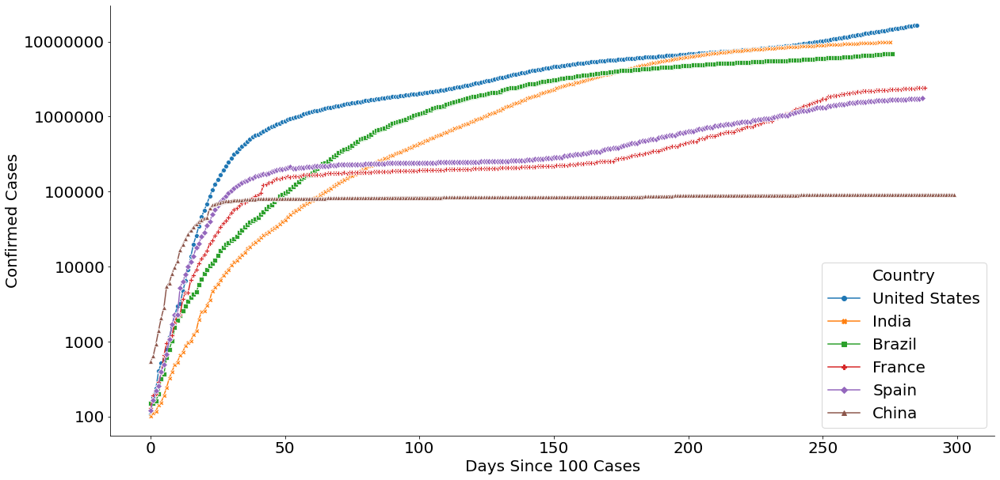

In [41]:
fig, ax1 = plt.subplots(figsize=(20,10))
sns.lineplot(x="ds100", y="log_CC", ax=ax1,
             hue="Country", style='Country',
             markers=True, dashes=False, data=dfn[(dfn.ds100<300)])

ax1.tick_params(labelsize=20)
ax1.legend(loc='lower right', prop={'size': 20})
ax1.set_xlabel('Days Since 100 Cases', fontsize=20)
ax1.set_ylabel('Confirmed Cases', fontsize=20)

yticks = [2, 3, 4, 5, 6, 7]
ax1.set_yticks(yticks)
ax1.set_yticklabels([100, 1000, 10000, 100000, 1000000, 10000000])

sns.despine()